In [2]:
import pandas as pd  # operate with dataframes
import scipy.io  # to load Matlab data
import matplotlib.pyplot as plt  # mother of plots for Python
import seaborn as sns  
import numpy as np  # array/matrix operations (e.g. linear algebra)
from cmcrameri import cm
import scipy.signal
import pyxdf
from scipy.ndimage import gaussian_filter1d
from statsmodels import robust
from scipy.stats import median_abs_deviation
from PIL import Image
from scipy.stats import f_oneway
from scipy.io import savemat
import random

In [3]:
PATH_REPO = ".../repos/wd-pilot-pipeline"
PATH_FOREYE = f"{PATH_REPO}/data/village/processed/MAD_sacc_newfile" # new path, potentially change
PATH_TRG = f"{PATH_REPO}/data/village/processed/Trigger_MAD_newfile"
PATH_MATLABPLOTS = f"{PATH_REPO}/data/village/processed/face_paper"
PATH_ERPS = ".../processedData/village/preprocessed/"
PATH_EEG = f"{PATH_REPO}/data/village/processed/EEG"
PATH_PROC = f"{PATH_REPO}/data/village/processed"
PATH_RAW = f"{PATH_REPO}/data/village/raw"


In [4]:
recordings = pd.read_csv(f"{PATH_REPO}/recordings_village.csv", index_col=0)
# only keep the subjects we will include in the paper!

subs_to_include = [1,4,5,11,16,18,19,20,21,29,30,33,34,36,37,38,41,
                   42,43,44,45,46,47,48,49,50,53,54,56,57,58,59,60]


recordings["files"] = [
    int(f[:2]) if int(f[:2]) in subs_to_include else 0
    for f in recordings["file"]
]

recordings = recordings[recordings["files"] > 0]

recordings = recordings.drop("files", axis=1)



In [5]:
# color pallet used in the paper
bgrd_color='#66c2a5'
body_color='#fc8d62'
head_color='#8da0cb'

# Age & Gender

In [20]:
# order of ages randomly shuffled using: sorted(ages, key=lambda x: random.random())
ages = [22,25,20,22,28,22,24,27,27,21,19,25,20,20,21,20,19,23,20,20,24,24,22,23,20,22,25,26,25,22,26,22,21]
print(np.mean(ages))
print(round(np.std(ages),3))

# order of gender randomly shuffled using: sorted(gender, key=lambda x: random.random())
# gender: male = 0, female = 1, no non-binary
gender = [1,0,1,0,1,0,0,1,1,0,1,0,1,1,1,1,1,1,0,0,0,1,0,1,0,1,0,1,1,0,0,1,1]
print(np.sum(gender))


22.636363636363637
2.484
19


# Final Trigger Files: Gaze & Saccade Onset

In [152]:
# Taken from Moritz Lönker (BA 2023)
def compute_centroid(df, columns):
    centroid = df[columns].mean().values
    return centroid

def compute_saccade_amplitude(prev_gaze_centroid, prev_subject_centroid, gaze_centroid, subject_centroid):
    v_eye_vec = gaze_centroid - prev_gaze_centroid
    eye_vec = prev_gaze_centroid - prev_subject_centroid
    eye_vec = eye_vec/np.linalg.norm(eye_vec)
    projection = np.dot(v_eye_vec, eye_vec) * eye_vec
    v_eye_inplane = np.linalg.norm(v_eye_vec - projection)
    sacc_amplitude = np.arctan2(v_eye_inplane, np.linalg.norm(prev_subject_centroid - prev_gaze_centroid))
    return np.degrees(sacc_amplitude)

In [69]:
##### Saccade Onset!
# participants ids
ids = recordings.index.tolist()
idd = ids[:]

shift_corr = 1
shift_two = ["1dea5bd2-80d1-4068-b512-99c55f85f44c",
             '9c8b7189-b11a-4014-a2ea-3848cc68e7e3',]
shift_three = ["70656182-09b3-4c19-9ae2-0a2ab2e19fed","391543f6-7ff0-4ed3-aefd-c0ef68ebbbf3",
               '0e1d6bec-59fb-4faf-9ccb-0c4f4c52ddab','312425d7-bb57-49dc-9107-b6462b3c176c',
               'd6610468-645c-4e29-bef0-ce2ad45a5c3f',"bbd5f09e-6213-4c23-ad25-f63cd0c38b17",
               "4facb3ab-dfba-4953-b266-6368edac48d3",'e28fbd3e-516f-4c89-bc54-3cb32ddd5ef7',
               'e9b010ec-29a3-4084-88e8-832f8e33a6c8','ce4afb7b-f192-4726-87ef-2497b247648e']
shift_four = ["c924cc42-5987-4025-b026-c672e304599f","fdc06350-e1bb-4630-9d23-6631bb0a9498",
              "42785e0b-efab-44a1-8c9f-bab59edcc93e",]

added_end = 0
end_more = ['0b462e46-9a87-4e70-ab1d-0f53c35726ec','95184b7a-42f1-40b0-ae36-be6ef1e33f1d',
            'c4cb86a2-c2d6-40f0-b594-9bb3eb769189',"bbd5f09e-6213-4c23-ad25-f63cd0c38b17",
           'e28fbd3e-516f-4c89-bc54-3cb32ddd5ef7']
end_less = ['b3cee177-543e-4398-9075-5b671eed84ab','f25b9349-573e-4c97-974e-855d4b037c79',
            '6f6719eb-8c89-46fe-8b5e-3c81e0e40a84','16ae5535-ea8c-4ae2-9195-ef3abf811f97',
            '3aee7a2a-9c98-4af9-8bdc-b6b3ba8c73e1','ac35237b-e4b2-4744-bd17-02f44c3f6139']

for uid in idd:
    display(uid)
    
    # for some, we need additional linear drift correction
    if uid in shift_two:
        shift_corr = 2
    elif uid in shift_three:
        shift_corr = 3
    elif uid in shift_four:
        shift_corr = 4

    if uid in end_more:
        added_end = 0.022
    elif uid in end_less:
        added_end = -0.011

        
    # load raw data
    part = recordings.loc[uid].file
    
    data, _ = pyxdf.load_xdf(f"{PATH_RAW}/{part}")

    starts = []
    names = []
    ends = []
    # get the new time:
    for s in data:
        # stream name
        s_name = s["info"]["name"][0]
        # check SR of the EEG data
        if "openvibeSignal" in s_name:
            time_eeg = s["time_stamps"][0]
            time_eeg_end = s["time_stamps"][-1]
        elif "openvibeMarkers" not in s_name:
            starts.append(s["time_stamps"][0])
            names.append(s_name)
            ends.append(s["time_stamps"][-1])
        if "EyeTrackingWorld" in s_name:
            et_start = s["time_stamps"][0]

    to_sub = et_start - min(starts)  # this is done to correct for the onset
    start = min(starts) - time_eeg
    # TBD: decide which end to use!!!
    end_e = ends[starts.index(min(starts))] - time_eeg_end
    end = max(ends) - time_eeg_end
    if end > 0.2:
        end = end_e
    end = end + added_end 

    # load data
    for_eye = pd.read_csv(f"{PATH_FOREYE}/correTS_mad_wobig_{uid}.csv", index_col=0)


    # correct unity with the different timestamps
    time = for_eye["time"].tolist() + to_sub
    time = [round(t, 3) for t in time]

    # interpolate the timestamps but save previous version
    ts = np.linspace(time[0], time[-1], num=int(time[-1] * 1000))
    ts = [round(t, 3) for t in ts]
    ts = list(dict.fromkeys(ts))  # remove dublicates
    
    # add shift
    dynamic_shift = end - start

    drift_correction_np = np.linspace(
        0, (dynamic_shift*shift_corr), len(ts)
    )  # np.linspace(start,end,num)
    
    # linearly correct the timestamps from start to end given the drift increase over time 'dynamic_shift'
    ts_shift = (ts - drift_correction_np).tolist()

    # take interpolated ts out
    time_df = pd.DataFrame(
        list(zip(ts, ts_shift)), columns=["time", "time_shift"]
    )
    time_df = time_df[time_df["time"].isin(time)]

    # exchange the times in for_eye
    for_eye["time"] = time_df["time_shift"].tolist()



    # --- SACCADE AMPLITUDE ---
    prev_gaze_centroid = None
    prev_subject_centroid = None
    for_eye['saccade_amplitude'] = np.nan
    start_indices = for_eye[for_eye['events'] == 2.0].index
    end_indices = for_eye[for_eye['events'] == -2.0].index

    if len(end_indices) > len(start_indices):
        if end_indices[0] < start_indices[0]:
            end_indices = end_indices[1:]
        else: 
            print(uid)

    for start, end in zip(start_indices, end_indices):
        group_df = for_eye.loc[start:end]
        # Compute the centroid of the gaze positions and the mean timestamp
        gaze_centroid = compute_centroid(group_df, ['xhpoo', 'yhpoo', 'zhpoo'])
        subject_centroid = compute_centroid(group_df, ['xcoord_orig', 'ycoord_orig', 'zcoord_orig'])

        # Compute the saccade amplitude and store it in the dataframe
        if prev_gaze_centroid is not None and prev_subject_centroid is not None:
            for_eye.loc[start:end, 'saccade_amplitude'] = compute_saccade_amplitude(prev_gaze_centroid, prev_subject_centroid, gaze_centroid, subject_centroid)

        # Update the previous centroids and timestamp
        prev_gaze_centroid = gaze_centroid
        prev_subject_centroid = subject_centroid
        # --- SACCADE AMPLITUDE ---

    # create triggers as done in the code before
    # variables
    gaze = for_eye[(for_eye["events"] == 2.0) |(for_eye["events"] == 1.0)]
    gaze["time"] = gaze["time"].shift(1)
    gaze = gaze[gaze["time"].notna()]

    gaze = gaze[gaze["events"] == 2.0]

    gaze = gaze[
        ~gaze["long_events"].isnull()
    ]  # this changes nr. of face gazes from 52 to 48

    no_name = gaze[gaze["names"].isnull()]
    gaze = gaze[~gaze["names"].isnull()]
    bg_gaze = gaze[~gaze["names"].str.contains("NPC|face")]
    body_gaze = gaze[gaze["names"].str.contains("NPC", regex=False, na=False)]
    face_gaze = gaze[gaze["names"].str.contains("face", regex=False, na=False)]


    # create the trigger df:
    # first get all the starts in one column
    lat = pd.concat([bg_gaze["time"], body_gaze["time"], face_gaze["time"], no_name["time"]])
    lat = pd.DataFrame(lat)

    # then add the type: 2 for background, 1 for NPCs and 0 for faces, 3 for no name
    lat["type"] = (
        [2] * len(bg_gaze["time"])
        + [1] * len(body_gaze["time"])
        + [0] * len(face_gaze["time"])
        + [3] * len(no_name["time"])
    )
    

    # sort it by start so that all the events are in correct order
    lat = lat.sort_values(by=["time"])

    # rename start to latency
    lat = lat.rename(columns={"time": "latency"})
    lat["saccade_amp"] = gaze["saccade_amplitude"]

    lat.to_csv(f"{PATH_TRG}/try_TriggerFile_saccadeOnset_{uid}.csv", index=False)


'3aee7a2a-9c98-4af9-8bdc-b6b3ba8c73e1'

/tmp/ipykernel_1334803/450313540.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gaze["time"] = gaze["time"].shift(1)


In [155]:
##### Gaze Onset!
# participants ids
ids = recordings.index.tolist()
idd = ids[:]

shift_corr = 1
shift_two = ["1dea5bd2-80d1-4068-b512-99c55f85f44c",
             '9c8b7189-b11a-4014-a2ea-3848cc68e7e3',]
shift_three = ["70656182-09b3-4c19-9ae2-0a2ab2e19fed","391543f6-7ff0-4ed3-aefd-c0ef68ebbbf3",
               '0e1d6bec-59fb-4faf-9ccb-0c4f4c52ddab','312425d7-bb57-49dc-9107-b6462b3c176c',
               'd6610468-645c-4e29-bef0-ce2ad45a5c3f',"bbd5f09e-6213-4c23-ad25-f63cd0c38b17",
               "4facb3ab-dfba-4953-b266-6368edac48d3",'e28fbd3e-516f-4c89-bc54-3cb32ddd5ef7',
               'e9b010ec-29a3-4084-88e8-832f8e33a6c8','ce4afb7b-f192-4726-87ef-2497b247648e']
shift_four = ["c924cc42-5987-4025-b026-c672e304599f","fdc06350-e1bb-4630-9d23-6631bb0a9498",
              "42785e0b-efab-44a1-8c9f-bab59edcc93e",]

added_end = 0
end_more = ['0b462e46-9a87-4e70-ab1d-0f53c35726ec','95184b7a-42f1-40b0-ae36-be6ef1e33f1d',
            'c4cb86a2-c2d6-40f0-b594-9bb3eb769189',"bbd5f09e-6213-4c23-ad25-f63cd0c38b17",
           'e28fbd3e-516f-4c89-bc54-3cb32ddd5ef7']
end_less = ['b3cee177-543e-4398-9075-5b671eed84ab','f25b9349-573e-4c97-974e-855d4b037c79',
            '6f6719eb-8c89-46fe-8b5e-3c81e0e40a84','16ae5535-ea8c-4ae2-9195-ef3abf811f97',
            '3aee7a2a-9c98-4af9-8bdc-b6b3ba8c73e1','ac35237b-e4b2-4744-bd17-02f44c3f6139']

for uid in idd:
    display(uid)
    
    # for some, we need additional linear drift correction
    if uid in shift_two:
        shift_corr = 2
    elif uid in shift_three:
        shift_corr = 3
    elif uid in shift_four:
        shift_corr = 4

    if uid in end_more:
        added_end = 0.022
    elif uid in end_less:
        added_end = -0.011
        
    # load raw data
    part = recordings.loc[uid].file
    
    data, _ = pyxdf.load_xdf(f"{PATH_RAW}/{part}")

    starts = []
    names = []
    ends = []
    # get the new time:
    for s in data:
        # stream name
        s_name = s["info"]["name"][0]
        # check SR of the EEG data
        if "openvibeSignal" in s_name:
            time_eeg = s["time_stamps"][0]
            time_eeg_end = s["time_stamps"][-1]
        elif "openvibeMarkers" not in s_name:
            starts.append(s["time_stamps"][0])
            names.append(s_name)
            ends.append(s["time_stamps"][-1])
        if "EyeTrackingWorld" in s_name:
            et_start = s["time_stamps"][0]

    to_sub = et_start - min(starts)  # this is done to correct for the onset
    start = min(starts) - time_eeg

    end_e = ends[starts.index(min(starts))] - time_eeg_end
    end = max(ends) - time_eeg_end
    if end > 0.2:
        end = end_e
    end = end + added_end 

    # load data
    for_eye = pd.read_csv(f"{PATH_FOREYE}/correTS_mad_wobig_{uid}.csv", index_col=0)


    # correct unity with the different timestamps
    time = for_eye["time"].tolist() + to_sub
    time = [round(t, 3) for t in time]

    # interpolate the timestamps but save previous version
    ts = np.linspace(time[0], time[-1], num=int(time[-1] * 1000))
    ts = [round(t, 3) for t in ts]
    ts = list(dict.fromkeys(ts))  # remove dublicates
    
    # add shift
    dynamic_shift = end - start

    drift_correction_np = np.linspace(
        0, (dynamic_shift*shift_corr), len(ts)
    )  # np.linspace(start,end,num)
    
    # linearly correct the timestamps from start to end given the drift increase over time 'dynamic_shift'
    ts_shift = (ts - drift_correction_np).tolist()

    # take interpolated ts out
    time_df = pd.DataFrame(
        list(zip(ts, ts_shift)), columns=["time", "time_shift"]
    )
    time_df = time_df[time_df["time"].isin(time)]

    # exchange the times in for_eye
    for_eye["time"] = time_df["time_shift"].tolist()



    # --- SACCADE AMPLITUDE ---
    prev_gaze_centroid = None
    prev_subject_centroid = None
    for_eye['saccade_amplitude'] = np.nan
    start_indices = for_eye[for_eye['events'] == 2.0].index
    end_indices = for_eye[for_eye['events'] == -2.0].index

    if len(end_indices) > len(start_indices):
        if end_indices[0] < start_indices[0]:
            end_indices = end_indices[1:]
        else: 
            print(uid)

    for start, end in zip(start_indices, end_indices):
        group_df = for_eye.loc[start:end]
        # Compute the centroid of the gaze positions and the mean timestamp
        gaze_centroid = compute_centroid(group_df, ['xhpoo', 'yhpoo', 'zhpoo'])
        subject_centroid = compute_centroid(group_df, ['xcoord_orig', 'ycoord_orig', 'zcoord_orig'])

        # Compute the saccade amplitude and store it in the dataframe
        if prev_gaze_centroid is not None and prev_subject_centroid is not None:
            for_eye.loc[start:end, 'saccade_amplitude'] = compute_saccade_amplitude(prev_gaze_centroid, prev_subject_centroid, gaze_centroid, subject_centroid)

        # Update the previous centroids and timestamp
        prev_gaze_centroid = gaze_centroid
        prev_subject_centroid = subject_centroid
        # --- SACCADE AMPLITUDE ---

    # create triggers as done in the code before
    # variables
    gaze = for_eye[(for_eye["events"] == 2.0) |(for_eye["events"] == 1.0)]
    gaze["sacc_dur"] = gaze["length"].shift(1)

    gaze["sacc_onset_corr"] = 0-(gaze["sacc_dur"])*1000
    
    gaze = gaze[gaze["time"].notna()]

    gaze = gaze[gaze["events"] == 2.0]

    gaze = gaze[~gaze["names"].isnull()]
    gaze = gaze[
        ~gaze["long_events"].isnull()
    ]  # this changes nr. of face gazes from 52 to 48

    no_name = gaze[gaze["names"].isnull()]
    gaze = gaze[~gaze["names"].isnull()]
    bg_gaze = gaze[~gaze["names"].str.contains("NPC|face")]
    body_gaze = gaze[gaze["names"].str.contains("NPC", regex=False, na=False)]
    face_gaze = gaze[gaze["names"].str.contains("face", regex=False, na=False)]


    # create the trigger df:
    # first get all the starts in one column
    lat = pd.concat([bg_gaze["time"], body_gaze["time"], face_gaze["time"], no_name["time"]])
    lat = pd.DataFrame(lat)

    # then add the type: 2 for background, 1 for NPCs and 0 for faces, 3 for no name
    lat["type"] = (
        [2] * len(bg_gaze["time"])
        + [1] * len(body_gaze["time"])
        + [0] * len(face_gaze["time"])
        + [3] * len(no_name["time"])
    )
    

    # sort it by start so that all the events are in correct order
    lat = lat.sort_values(by=["time"])

    # rename start to latency
    lat = lat.rename(columns={"time": "latency"})
    lat["saccade_amp"] = gaze["saccade_amplitude"]
    lat["saccade_dur"] = gaze["sacc_dur"]
    lat["saccade_onset"] = gaze["sacc_onset_corr"]

    lat.to_csv(f"{PATH_TRG}/try_TriggerFile_gazeOnset_{uid}.csv", index=False)


'70656182-09b3-4c19-9ae2-0a2ab2e19fed'

/tmp/ipykernel_455344/1040397213.py:142: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gaze["sacc_dur"] = gaze["length"].shift(1)
/tmp/ipykernel_455344/1040397213.py:144: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gaze["sacc_onset_corr"] = 0-(gaze["sacc_dur"])*1000


# Figure 1: Experimental Setup

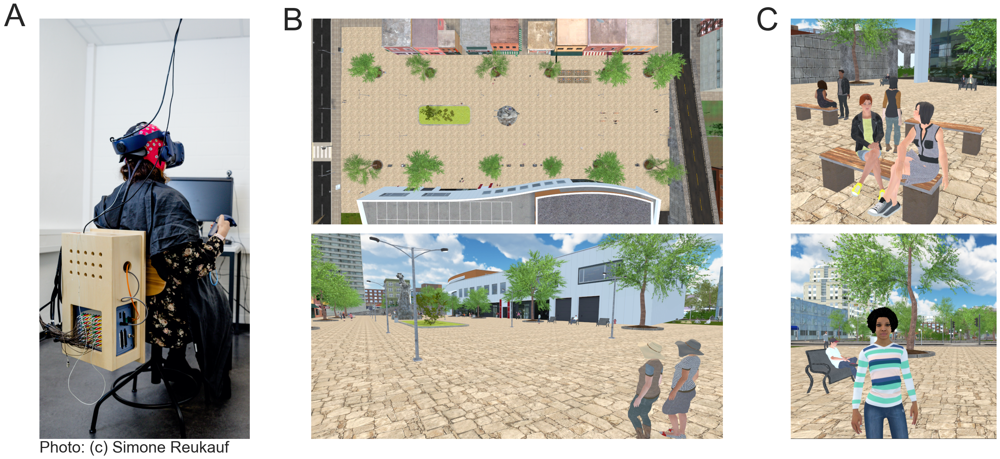

In [10]:
# first get the 4 plots on the right organised
# define
labelsize = 40 # text
legendsize = 40 # ledgend
ticksize = 30 # ticks
numbersize = 60 # A, B etc.
fname = "Arial" # font name
plt.rcParams["font.family"] = fname

plt.figure(figsize=(33, 12), constrained_layout=True)

sns.set_style("white") 
# grid to have the subplots arranged nicely
ax0 = plt.subplot2grid(shape=(2, 5), loc=(0, 0), rowspan=2, colspan=1)
ax1 = plt.subplot2grid(shape=(2, 5), loc=(0, 1), rowspan=1, colspan=2)
ax2 = plt.subplot2grid(shape=(2, 5), loc=(1, 1), rowspan=1, colspan=2)
ax3 = plt.subplot2grid(shape=(2, 5), loc=(0, 3), rowspan=1, colspan=1)
ax4 = plt.subplot2grid(shape=(2, 5), loc=(1, 3), rowspan=1, colspan=1)


image0 = Image.open("./images/Fig1_img/Setup.jpg")
image1 = Image.open("./images/img_400dpi/walkableArea400.png")
image2 = Image.open("./images/img_400dpi/walkableAreaFPV400.png")
image3 = Image.open("./images/img_400dpi/ped1400.png")
image4 = Image.open("./images/img_400dpi/ped2400.png")


ax0.imshow(image0)
ax1.imshow(image1)
ax2.imshow(image2)
ax3.imshow(image3)
ax4.imshow(image4)

ax0.axis('off') # no black box surrounding the image
ax1.axis('off') # no black box surrounding the image
ax2.axis('off') # no black box surrounding the image
ax3.axis('off') # no black box surrounding the image
ax4.axis('off') # no black box surrounding the image

ax0.text(0.45, -0.021, 'Photo: (c) Simone Reukauf',fontsize=30, horizontalalignment='center', 
         verticalalignment='center', transform=ax0.transAxes, fontname=fname) # credit
ax0.set_title("A", fontsize=numbersize, fontweight="bold",loc="left", x=-0.17, y=1.02, pad=-30, fontname=fname) 
ax1.set_title("B", fontsize=numbersize, fontweight="bold",loc="left", x=-0.07, y=1.02, pad=-30, fontname=fname) 
ax3.set_title("C", fontsize=numbersize, fontweight="bold",loc="left", x=-0.17, y=1.02, pad=-30, fontname=fname) 

plt.savefig("./images/Fig1_img/Fig1_Setup.png", bbox_inches="tight", pad_inches=0, dpi=400)
plt.show()

# Analysis of Gaze Events - reported in writing

In [27]:
### Number of Gaze Events:
ids = recordings.index.tolist()
idd = ids[:]

trial_count = {}
trial_count['bgnd'] = {}
trial_count['body'] = {}
trial_count['head'] = {}
for uid in idd:
    lat = pd.read_csv(f"{PATH_TRG}/try_TriggerFile_saccadeOnset_{uid}.csv", index_col=0)
    # 2 for background, 1 for NPCs and 0 for faces
    trial_count['bgnd'][uid] = len(lat[lat['type'] == 2])
    trial_count['body'][uid] = len(lat[lat['type'] == 1])
    trial_count['head'][uid] = len(lat[lat['type'] == 0])

trial_count = pd.DataFrame(trial_count)

# display the statistics
display(trial_count.median())
display(trial_count[['bgnd', 'body', 'head']].apply(robust.mad))

print(trial_count.min())
print(trial_count.max())

bgnd    3968.0
body     741.0
head     151.0
dtype: float64

bgnd    492.223937
body    220.907731
head    133.434200
dtype: float64

bgnd    2848
body     290
head      17
dtype: int64
bgnd    4869
body    1296
head     913
dtype: int64


In [22]:
### Check if nr of bodies and nr of gazes correlate
ids = recordings.index.tolist()
idd = ids[:]

stats = {}
stats["nr_body"] = {}
stats["nr_face"] = {}
for uid in idd:
    lat = pd.read_csv(f"{PATH_TRG}/try_TriggerFile_saccadeOnset_{uid}.csv", index_col=0)
    # 2 for background, 1 for NPCs and 0 for faces
    stats['nr_body'][uid] = len(lat[lat['type'] == 1])
    stats['nr_face'][uid] = len(lat[lat['type'] == 0])


stats = pd.DataFrame(stats)

# Check if correlation is significnat
# r = Pearson correlation coefficient
r, p = scipy.stats.pearsonr(stats["nr_face"], stats["nr_body"])
display(r)
display(round(p,3))

0.18404974379354022

0.305

In [28]:
### Gaze & Sacde Durations
ids = recordings.index.tolist()
idd = ids[:]

start_fr = 20  # how many frames before gaze onset
end_fr = 35  # how many frames to include after gaze onset


names = ["Background","Body","Head"]
gazes = {}
saccs = {}
# do this three times: head, body, background
for gr in range(3):
    data = {} # save data
    gazes[names[gr]] = {}
    saccs[names[gr]] = {}
    
    for i, uid in enumerate(idd):
        # load data
        for_eye = pd.read_csv(
            f"{PATH_FOREYE}/correTS_mad_wobig_{uid}.csv", index_col=0
        )

        # get gazes
        gaze = for_eye[for_eye["events"] == 2.0]
        gaze = gaze[~gaze["long_events"].isnull()]
        gaze = gaze[~gaze["names"].isnull()]
        
        sacc = for_eye[for_eye["events"] == 1.0]
        sacc = sacc[~sacc["long_events"].isnull()]
        prev_ev = for_eye[for_eye["events"] == -2.0]
        idx = prev_ev.index.tolist()
        idx = [i+1 for i in idx]
        prev_ev.index = idx
        sacc['prev_event'] = prev_ev["names"]
        sacc = sacc[~sacc["names"].isnull()]
        sacc = sacc[~sacc["prev_event"].isnull()]
        
        # bgrd
        if gr == 0:
            sub_set = gaze[~gaze["names"].str.contains("NPC|face")]
            sub_set_s = sacc[~sacc["names"].str.contains("NPC|face")]
        # body
        elif gr == 1:
            sub_set = gaze[
                gaze["names"].str.contains("NPC", regex=False, na=False)
            ]
            sub_set_s = sacc[sacc["names"].str.contains("NPC", regex=False, na=False)]
        # head
        else:
            sub_set = gaze[
                gaze["names"].str.contains("face", regex=False, na=False)
            ]
            sub_set_s = sacc[sacc["names"].str.contains("face", regex=False, na=False)]

        gazes[names[gr]][uid] = np.nanmedian(sub_set["length"])
        saccs[names[gr]][uid] = np.nanmedian(sub_set_s["length"])
        
gazes = pd.DataFrame(gazes)
saccs = pd.DataFrame(saccs)

print()
print("Gazes:")
display(gazes.median())
mad_values = gazes.apply(lambda x: median_abs_deviation(x, scale='normal'))
print(mad_values)
print()
print("Saccades:")
display(saccs.median())
mad_values = saccs.apply(lambda x: median_abs_deviation(x, scale='normal'))
print(mad_values)


Gazes:


Background    0.186
Body          0.200
Head          0.178
dtype: float64

Background    0.013343
Body          0.016309
Head          0.022980
dtype: float64

Saccades:


Background    0.076
Body          0.066
Head          0.056
dtype: float64

Background    0.002965
Body          0.001483
Head          0.014826
dtype: float64


In [29]:
### Saccade Amplitudes
ids = recordings.index.tolist()
idd = ids[:]

bgrd_mean = []
body_mean = []
head_mean = []
for uid in idd:
    lat = pd.read_csv(f"{PATH_TRG}/try_TriggerFile_saccadeOnset_{uid}.csv", index_col=0)
    lat = lat[~lat["saccade_amp"].isnull()]
    # 2 for background, 1 for NPCs and 0 for faces
    bgrd_mean = bgrd_mean + [np.mean(lat[lat['type'] == 2]['saccade_amp'].tolist())]
    body_mean = body_mean + [np.mean(lat[lat['type'] == 1]['saccade_amp'].tolist())]
    head_mean = head_mean + [np.mean(lat[lat['type'] == 0]['saccade_amp'].tolist())]
    
mean_stim = pd.DataFrame({'bgrd':bgrd_mean,'body':body_mean,'head':head_mean})
display(mean_stim.median())
mad_values = mean_stim.apply(lambda x: median_abs_deviation(x, scale='normal'))
print(mad_values)


bgrd    12.119381
body     7.212068
head     5.350077
dtype: float64

bgrd    2.103578
body    1.618460
head    1.491464
dtype: float64


# Figure 2: Distribution of Events over Time (CDF) + Trajectory Plot

In [12]:
def normalize(val, old_min, old_max, new_min, new_max):
    return (val - old_min) / (old_max - old_min) * (new_max - new_min) + new_min

In [1]:
### Distribution of gazes & bodies over time
labelsize = 40 #text
legendsize = 40 #ledgend
ticksize = 30 #ticks
numbersize = 60 #A, B etc.
fname = "Arial" # font name

plt.figure(figsize=(30, 30), constrained_layout=True)

sns.set_style("white") 
# grid to have the subplots arranged nicely
ax1 = plt.subplot2grid(shape=(3,3), loc=(0, 0), rowspan=2, colspan=3)
ax2 = plt.subplot2grid(shape=(3,3), loc=(2, 0), rowspan=1, colspan=1)
ax3 = plt.subplot2grid(shape=(3,3), loc=(2, 1), rowspan=1, colspan=1)
ax4 = plt.subplot2grid(shape=(3,3), loc=(2, 2), rowspan=1, colspan=1)

ax2.set_aspect(1.0/ax2.get_data_ratio(), adjustable='box')
ax3.set_aspect(1.0/ax2.get_data_ratio(), adjustable='box')
ax4.set_aspect(1.0/ax2.get_data_ratio(), adjustable='box')




### Plot Gaze sequenze
gazeidx = 3
npc = "415"
# New range
new_min_x = 0
new_max_x = 1400  # X-axis range of the image
new_min_y = 0
new_max_y = 600  # Y-axis range of the image

img = plt.imread("./images/img_400dpi/Screenshot 2024-10-17 155256 Kopie400.png")
ax1.imshow(img, alpha=0.8) 

ids = recordings.index.tolist()
uid = ids[-1]
for_eye = pd.read_csv(f"{PATH_FOREYE}/correTS_mad_wobig_{uid}.csv", index_col=0)
ts = for_eye['time'].tolist() # get time

gaze = for_eye[for_eye["events"] == 2.0]
gaze = gaze[~gaze["long_events"].isnull()]  
gaze = gaze[~gaze["names"].isnull()]

body_gaze = gaze[gaze["names"].str.contains("NPC", regex=False, na=False)]
face_gaze = gaze[gaze["names"].str.contains("face", regex=False, na=False)]
body_gaze = body_gaze[body_gaze["names"].str.contains(npc, regex=False, na=False)]
face_gaze = face_gaze[face_gaze["names"].str.contains(npc, regex=False, na=False)]

time = ts[ts.index(list(filter(lambda i: i >= 
                               body_gaze['time'].tolist()[gazeidx]-60, ts))[0]
                  ) : ts.index(list(filter(lambda i: i <= body_gaze['time'].tolist()[gazeidx]+60, ts))[-1])+ 1]  
for_eye = for_eye.iloc[ts.index(time[0]) : (ts.index(time[-1]) + 1)]

old_min_x = for_eye['xcoord_orig'].min()-1 #505
old_max_x = for_eye['xcoord_orig'].max()-1 #642

old_min_y = for_eye['zcoord_orig'].min()+2 #519
old_max_y = for_eye['zcoord_orig'].max()+2 #655

for_eye['xcoord_orig_normalized'] = for_eye['xcoord_orig'].apply(normalize, args=(old_min_x, old_max_x, new_min_x, new_max_x))
for_eye['zcoord_orig_normalized'] = for_eye['zcoord_orig'].apply(normalize, args=(old_min_y, old_max_y, new_min_y, new_max_y))

old_min_x = for_eye['xhpoo'].min()+2 #505
old_max_x = for_eye['xhpoo'].max()+2 #642

old_min_y = for_eye['zhpoo'].min()-2 #519
old_max_y = for_eye['zhpoo'].max()-2 #655

for_eye['xhpoo_normalized'] = for_eye['xhpoo'].apply(normalize, args=(old_min_x, old_max_x, new_min_x, new_max_x))
for_eye['zhpoo_normalized'] = for_eye['zhpoo'].apply(normalize, args=(old_min_y, old_max_y, new_min_y, new_max_y))

x = for_eye["xcoord_orig_normalized"] 
y = for_eye["zcoord_orig_normalized"] 

addx = -330
addy = 0

gaze = for_eye.loc[ts.index(time[0]) : (ts.index(time[-1]) + 1)]
gaze = gaze[gaze["events"] == 2.0]
gaze = gaze[~gaze["long_events"].isnull()]  
gaze = gaze[~gaze["names"].isnull()]

for index, row in gaze.iterrows():
    start_point = (gaze.loc[index, 'xcoord_orig_normalized'], gaze.loc[index, 'zcoord_orig_normalized'])  # Starting point of the line
    end_point = (gaze.loc[index, 'xhpoo_normalized'], gaze.loc[index, 'zhpoo_normalized'])   # The corresponding points in gaze for lines
    if npc in gaze.loc[index, 'names']:
        ax1.annotate("",
             xy=(end_point[0]+addx+75, end_point[1]+addy-300),        # End point
             xytext=(start_point[0]+addx, start_point[1]+addy), # Start point
             arrowprops=dict(arrowstyle="->",lw=8, color="#FF0000", mutation_scale=20)) # can alsu use palette[1]
# now plot a few more gazes
gaze = gaze.reset_index()
gaze = gaze.iloc[70:170]
cnt = 0
for idx, (index, row) in enumerate(gaze.iterrows()):
    if idx % 30 == 0:  # Only process every 50th row
        start_point = (gaze.loc[index, 'xcoord_orig_normalized'], gaze.loc[index, 'zcoord_orig_normalized'])  # Starting point of the line
        end_point = (gaze.loc[index, 'xhpoo_normalized'], gaze.loc[index, 'zhpoo_normalized'])   # The corresponding points in gaze for lines
        if cnt == 1:
            ax1.annotate("",
                 xy=(end_point[0]-100, end_point[1]-100),  # End point
                 xytext=(start_point[0]-150, start_point[1]-163), # Start point
                 arrowprops=dict(arrowstyle="->", lw=8, color="#0000FF", mutation_scale=20)) 
        elif cnt == 2:
            ax1.annotate("",
                 xy=(end_point[0]-220, end_point[1]-230),        # End point
                 xytext=(start_point[0]+addx, start_point[1]+addy), # Start point
                 arrowprops=dict(arrowstyle="->", lw=8, color="#0000FF", mutation_scale=20)) 
        elif cnt == 3:
            ax1.annotate("",
                 xy=(end_point[0]-500, end_point[1]-100),        # End point
                 xytext=(start_point[0]-500, start_point[1]-110), # Start point
                 arrowprops=dict(arrowstyle="->", lw=8, color="#0000FF", mutation_scale=20)) 
        cnt = cnt + 1

ax1.scatter(
        x=x+addx,
        y=y+addy, 
        color="k",
        marker=".",
        alpha=1.0,
        s=300,
        linewidth=0,
    )  

ax1.set_xlim(0, 1000)  # X-axis from 0 to 1400
ax1.set_ylim(0, 600)   # Y-axis from 0 to 600
ax1.invert_yaxis()
ax1.axis('off')




#### Plot CDFs

# participants ids
ids = recordings.index.tolist()
idd = ids[:]
l1 = []

color = iter(cm.roma(np.linspace(0, 1, len(idd))))

# load data:
for i, uid in enumerate(idd):
    c = next(color)
    for_eye = pd.read_csv(f"{PATH_FOREYE}/correTS_mad_wobig_{uid}.csv", index_col=0)
    for_eye['time'] = np.arange(0, 0.011*len(for_eye), 0.011)

    gaze = for_eye[for_eye["events"] == 2.0]
    gaze = gaze[~gaze["long_events"].isnull()]  
    gaze = gaze[~gaze["names"].isnull()]

    bgrd_gaze = gaze[~gaze["names"].str.contains("NPC|face")]
    body_gaze = gaze[gaze["names"].str.contains("NPC", regex=False, na=False)]
    face_gaze = gaze[gaze["names"].str.contains("face", regex=False, na=False)]

    gazes = [bgrd_gaze,body_gaze,face_gaze]
    axes = [ax2,ax3,ax4]
    axis_tks = [0,0.5,1]
    for j in range(3):
        gaze = gazes[j]

        N = len(gaze)
        x = gaze['time'].tolist()
        
        y = np.arange(1,N+1) / N
    
        y_new = 1. * np.arange(N) / (N - 1)
    
        x_array = np.array(x)  # Convert list to numpy array
        x_new = (x_array - x_array.min()) / (x_array.max() - x_array.min())
    
    
        l1.append(len(x))
        axes[j].plot(x_new,y_new,c=c, marker = '', linestyle = '-')
        if i == 0:
            axes[j].yaxis.set_tick_params(labelsize=ticksize)  # change tick size
            axes[j].xaxis.set_tick_params(labelsize=ticksize)
            axes[j].set_xticks(axis_tks)
            axes[j].set_yticks(axis_tks)

ax2.set_ylabel('ration of total gazes', fontsize=labelsize)
ax3.set_ylabel('ration of total gazes', fontsize=labelsize)
ax4.set_ylabel('ration of total gazes', fontsize=labelsize)
ax2.set_xlabel('ration of time passed', fontsize=labelsize)
ax3.set_xlabel('ration of time passed', fontsize=labelsize)
ax4.set_xlabel('ration of time passed', fontsize=labelsize)

ax1.set_title("A", fontsize=numbersize, fontweight="bold",loc="left", x=-0.035, y=1.05, pad=-30, fontname=fname) 
ax2.set_title("B", fontsize=numbersize, fontweight="bold",loc="left", x=-0.14, y=1.05, pad=-30, fontname=fname) 
ax3.set_title("C", fontsize=numbersize, fontweight="bold",loc="left", x=-0.14, y=1.05, pad=-30, fontname=fname) 
ax4.set_title("D", fontsize=numbersize, fontweight="bold",loc="left", x=-0.14, y=1.05, pad=-30, fontname=fname) 

plt.tight_layout()
plt.savefig("./Fig2_Trajectory_GazesOverTime.png", bbox_inches="tight", pad_inches=0.3, dpi=400)  
plt.show()

NameError: name 'plt' is not defined

# Figure 3: Single Subject Results

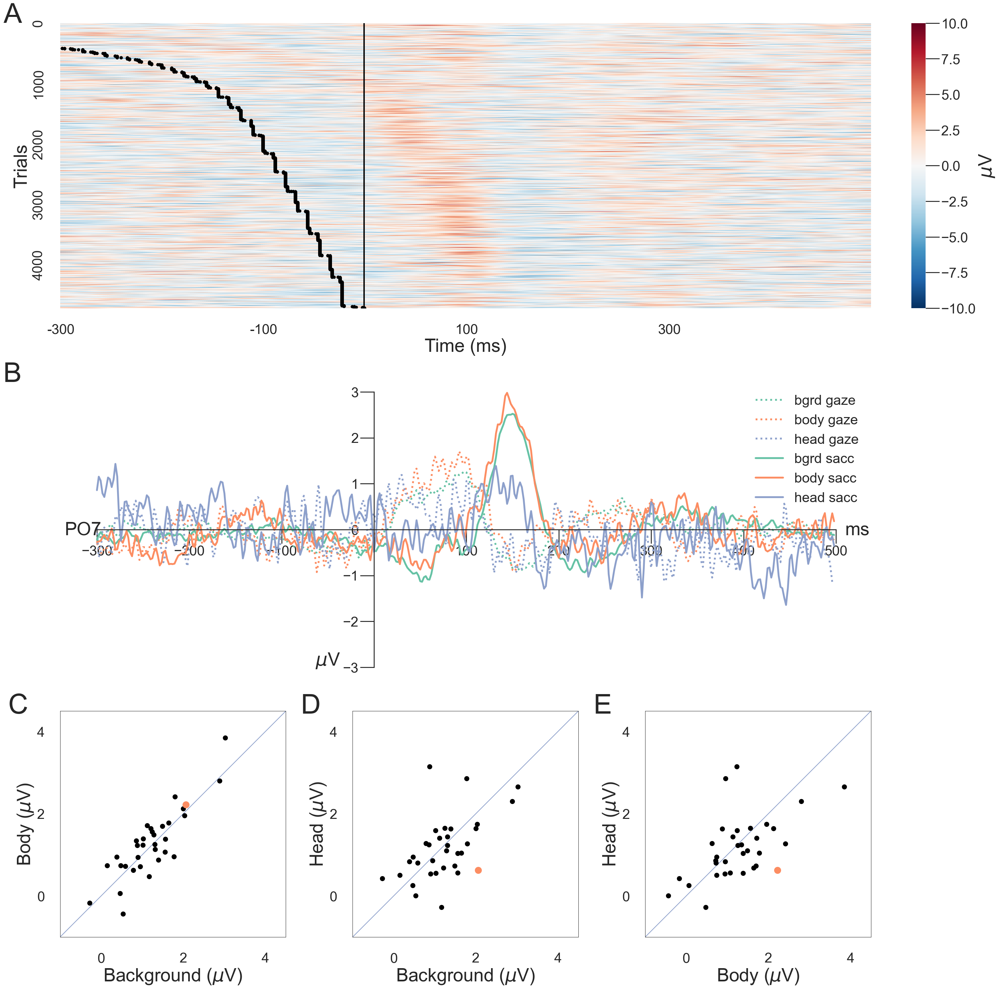

In [8]:
### Load already preprocessed data
sub = 42
mat = scipy.io.loadmat(f"{PATH_EEG}/Sub{sub}_trialOrderSaccAmp.mat")
data = pd.DataFrame(mat['data']).transpose()
rows_data = data.index.tolist()
event_data = mat['event']
# Extract fields
latency = np.array([item[0][0] for item in event_data['latency'][0]])
event_type = np.array([item[0][0] for item in event_data['type'][0]])
saccade_amp = np.array([item[0] if item.size > 0 else None for item in event_data['saccade_amp'][0]])  # Handle empty arrays
epoch = np.array([item[0][0] for item in event_data['epoch'][0]])
saccade_dur = np.array([item[0][0] if item.size > 0 else None for item in event_data['saccade_dur'][0]])  # Handle empty arrays
saccade_onset = np.array([item[0][0] if item.size > 0 else None for item in event_data['saccade_onset'][0]])  # Handle empty arrays

# Create DataFrame
events = pd.DataFrame({
    'latency': latency,
    'type': event_type,
    'saccade_dur': saccade_dur,
    'saccade_amp': saccade_amp,
    'epoch': epoch,
    'saccade_onset': saccade_onset
})

events = events.drop_duplicates(subset=['epoch'])

data['saccade_onset'] = events.saccade_onset.tolist()
data['saccade_dur'] = events.saccade_dur.tolist()
data = data.sort_values('saccade_dur', ascending=False)
data = data.reset_index(drop=True)
data = data.drop(columns=['saccade_dur'])
saccade_onset = data['saccade_onset'].tolist() 
data = data.drop(columns=['saccade_onset'])

data = data.apply(lambda x: gaussian_filter1d(x, sigma=2), axis=0)
data = pd.DataFrame(data).transpose()
data = data.apply(lambda x: gaussian_filter1d(x, sigma=5), axis=0)
data = pd.DataFrame(data).transpose()

data = data.to_numpy()

# plotting
start_fr = 305  # how many frames before gaze onset

# set up figure
rc = {"xtick.direction" : "inout", "ytick.direction" : "inout",
      "xtick.major.size" : 30, "ytick.major.size" : 30,
      "xtick.major.width" : 2, "ytick.major.width" : 2,
     "figure.figsize": (30, 30)}
with plt.rc_context(rc):
    plt.figure(constrained_layout=True)
    sns.set_style("white") 

    # define
    labelsize = 40 # text
    legendsize = 40 # ledgend
    ticksize = 30 # ticks
    numbersize = 60 # A, B etc.
    fname = "Arial" # font name
    plt.rcParams["font.family"] = fname
    # set up grid
    ax0 = plt.subplot2grid(shape=(3,3), loc=(0, 0), rowspan=1, colspan=3)   
    ax1 = plt.subplot2grid(shape=(3,3), loc=(1, 0), rowspan=1, colspan=3)    
    ax2 = plt.subplot2grid(shape=(3,3), loc=(2, 0), rowspan=1, colspan=1)
    ax3 = plt.subplot2grid(shape=(3,3), loc=(2, 1), rowspan=1, colspan=1)
    ax4 = plt.subplot2grid(shape=(3,3), loc=(2, 2), rowspan=1, colspan=1)

    ax2.set_aspect(1.0/ax2.get_data_ratio(), adjustable='box')
    ax3.set_aspect(1.0/ax3.get_data_ratio(), adjustable='box')
    ax4.set_aspect(1.0/ax4.get_data_ratio(), adjustable='box')

    
    #### Plot trial plot ####
    sns.heatmap(data, cmap="RdBu_r", xticklabels=100, yticklabels=1000, ax=ax0, vmin=-10, vmax=10,)  
    
    time = np.array(mat['times'][0].tolist())
    for i, highlight_value in enumerate(saccade_onset):
        closest_col = np.argmin(np.abs(time - highlight_value))
        # Plot a black marker at that position
        if closest_col != 0:
            ax0.plot(closest_col + 0.1, i + 0.1, 'ko')  # 'ko'
    
    
    # set a red line at gaze onset
    ax0.axvline(x=150, linewidth=3, color='k')
    # set axis labels + font
    ax0.set_xlabel("Time (ms)", fontsize=labelsize, fontname=fname)
    ax0.set_ylabel("Trials", fontsize=labelsize, fontname=fname)
    # set axis ticks + font
    for label in ax0.get_xticklabels(): # change tick font
        label.set_fontproperties(fname)
    for label in ax0.get_yticklabels():
        label.set_fontproperties(fname)
    ax0.yaxis.set_tick_params(labelsize=ticksize)  # change tick size
    ax0.xaxis.set_tick_params(labelsize=ticksize)
    # set color bar
    cbar = ax0.collections[0].colorbar
    cbar.ax.tick_params(labelsize=ticksize)
    cbar.set_label(u'$\it{\u03bc}$' + 'V', fontsize=labelsize, fontname=fname)
    # set x tick labels
    ax0.set_xticklabels([-300,-100,100,300,],)
    
    
    
    #### Single Subject ERP ####
    gaze_bgrd = mat['gaze_bgrd'][0].tolist()
    gaze_body = mat['gaze_body'][0].tolist()
    gaze_head = mat['gaze_head'][0].tolist()

    sacc_bgrd = mat['sacc_bgrd'][0].tolist()
    sacc_body = mat['sacc_body'][0].tolist()
    sacc_head = mat['sacc_head'][0].tolist()

    # plot the average ERP
    ax1.plot(time,gaze_bgrd,color=bgrd_color,linewidth=4,alpha=1,linestyle=':',label="bgrd gaze")
    ax1.plot(time,gaze_body,color=body_color,linewidth=4,alpha=1,linestyle=':',label="body gaze")
    ax1.plot(time,gaze_head,color=head_color,linewidth=4,alpha=1,linestyle=':',label="head gaze")

    ax1.plot(time,sacc_bgrd,color=bgrd_color,linewidth=4,alpha=1,label="bgrd sacc")
    ax1.plot(time,sacc_body,color=body_color,linewidth=4,alpha=1,label="body sacc")
    ax1.plot(time,sacc_head,color=head_color,linewidth=4,alpha=1,label="head sacc")

    # legend:
    handles, labels = ax1.get_legend_handles_labels()
    legend = ax1.legend(handles,labels,loc="upper right", fontsize=ticksize, frameon=False)
    # axis labels
    ax1.set_ylabel(u'$\it{\u03bc}$' + 'V', fontsize=labelsize, fontname=fname, loc='bottom', rotation = 0)
    ax1.yaxis.set_label_coords(0.315,-0.009)
    ax1.text(-335,-0.12,"PO7", fontsize=labelsize)
    ax1.text(510,-0.12,"ms", fontsize=labelsize)
    # ticks
    x = [-300,-200,-100,100,200,300,400,500]
    ax1.set_xticks(x)
    y = [-3,-2,-1,0,1,2,3]
    ax1.set_yticks(y)
    for label in ax1.get_xticklabels(): # change tick font
        label.set_fontproperties(fname)
    for label in ax1.get_yticklabels():
        label.set_fontproperties(fname)
    ax1.yaxis.set_tick_params(labelsize=ticksize)  # change tick size
    ax1.xaxis.set_tick_params(labelsize=ticksize)
    # adjust spines
    ax1.spines[['top','right']].set_visible(False)
    ax1.spines[['bottom','left']].set_linewidth(2)
    ax1.spines[['bottom','left']].set_position(('data', 0))
    ax1.spines[['bottom','left']].set_clip_on(True)
    ax1.spines[['left']].set_bounds([-3,3])
    ax1.spines[['bottom']].set_bounds([- 300,500])
    ax1.xaxis.set_ticks_position('bottom')
    ax1.yaxis.set_ticks_position('left')


    #### Plot peaks vs peaks ####
    chan = 'PO7'
    chanlocs = scipy.io.loadmat(".../chanLocs.mat")
    chanlocs = chanlocs['chanLocs']
    chanlocs = np.array([item[0][:] for item in chanlocs['labels'][0]]).tolist()
    chanidx = chanlocs.index(chan) # index
    
    mat = scipy.io.loadmat(f"{PATH_EEG}/FacePaper_ERPData_Full.mat") 
    sacc_bgrd = pd.DataFrame(mat['sacc_bgrd'][chanidx,:,:])
    sacc_body = pd.DataFrame(mat['sacc_body'][chanidx,:,:])
    sacc_head = pd.DataFrame(mat['sacc_head'][chanidx,:,:])
    
    ts = mat['times'][0].tolist()
    # taking the mean of the interval 150:170
    # taking the peak out of the interval 100:220
    time = ts[ts.index(list(filter(lambda i: i >= 150, ts))[0]) : ts.index(list(filter(lambda i: i <= 170, ts))[-1])+ 1]  
    bgrd = sacc_bgrd.iloc[ts.index(time[0]) : (ts.index(time[-1]) + 1)].mean().tolist()
    body = sacc_body.iloc[ts.index(time[0]) : (ts.index(time[-1]) + 1)].mean().tolist()
    head = sacc_head.iloc[ts.index(time[0]) : (ts.index(time[-1]) + 1)].mean().tolist()

    # bgrd vs body
    ax2.plot([-2,5],[-2,5],color=head_color, zorder=0)
    ax2.scatter(bgrd,body,color='k',s=100)
    ax2.scatter(bgrd[27],body[27],color=body_color,s=200)
    ax2.set_xlim(-1, 4.5)
    ax2.set_ylim(-1, 4.5)
    #ticks = [-1,0,1,2,3,4]
    ticks = [0,2,4]
    ax2.set_xticks(ticks)
    ax2.set_yticks(ticks)
    for label in ax2.get_xticklabels(): # change tick font
        label.set_fontproperties(fname)
    for label in ax2.get_yticklabels():
        label.set_fontproperties(fname)
    ax2.yaxis.set_tick_params(labelsize=ticksize)  # change tick size
    ax2.xaxis.set_tick_params(labelsize=ticksize)
    ax2.set_xlabel(u'Background ($\it{\u03bc}$V)', fontsize=labelsize, fontname=fname)
    ax2.set_ylabel(u'Body ($\it{\u03bc}$V)', fontsize=labelsize, fontname=fname)

    # brgd vs head
    ax3.plot([-2,5],[-2,5],color=head_color, zorder=0)
    ax3.scatter(bgrd,head,color='k',s=100)
    ax3.scatter(bgrd[27],head[27],color=body_color,s=200)
    ax3.set_xlim(-1, 4.5)
    ax3.set_ylim(-1, 4.5)
    #ticks = [-1,0,1,2,3,4]
    ticks = [0,2,4]
    ax3.set_xticks(ticks)
    ax3.set_yticks(ticks)
    for label in ax3.get_xticklabels(): # change tick font
        label.set_fontproperties(fname)
    for label in ax3.get_yticklabels():
        label.set_fontproperties(fname)
    ax3.yaxis.set_tick_params(labelsize=ticksize)  # change tick size
    ax3.xaxis.set_tick_params(labelsize=ticksize)
    ax3.set_xlabel(u'Background ($\it{\u03bc}$V)', fontsize=labelsize, fontname=fname)
    ax3.set_ylabel(u'Head ($\it{\u03bc}$V)', fontsize=labelsize, fontname=fname)

    # body vs head
    ax4.plot([-2,5],[-2,5],color=head_color, zorder=0)
    ax4.scatter(body,head,color='k',s=100)
    ax4.scatter(body[27],head[27],color=body_color,s=200)
    ax4.set_xlim(-1, 4.5)
    ax4.set_ylim(-1, 4.5)
    #ticks = [-1,0,1,2,3,4]
    ticks = [0,2,4]
    ax4.set_xticks(ticks)
    ax4.set_yticks(ticks)
    for label in ax4.get_xticklabels(): # change tick font
        label.set_fontproperties(fname)
    for label in ax4.get_yticklabels():
        label.set_fontproperties(fname)
    ax4.yaxis.set_tick_params(labelsize=ticksize)  # change tick size
    ax4.xaxis.set_tick_params(labelsize=ticksize)
    ax4.set_xlabel(u'Body ($\it{\u03bc}$V)', fontsize=labelsize, fontname=fname)
    ax4.set_ylabel(u'Head ($\it{\u03bc}$V)', fontsize=labelsize, fontname=fname)
    

ax0.set_title("A", fontsize=numbersize, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname) 
ax1.set_title("B", fontsize=numbersize, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname) 
ax2.set_title("C", fontsize=numbersize, fontweight="bold",loc="left", x=-0.23, y=1.05, pad=-30, fontname=fname) 
ax3.set_title("D", fontsize=numbersize, fontweight="bold",loc="left", x=-0.23, y=1.05, pad=-30, fontname=fname) 
ax4.set_title("E", fontsize=numbersize, fontweight="bold",loc="left", x=-0.23, y=1.05, pad=-30, fontname=fname) 

plt.savefig(f"./Fig3_singleSub_sub{sub}.png", bbox_inches="tight", pad_inches=0.3, dpi=400)    
plt.show()

In [50]:
ids = recordings.index.tolist()
uid = ids[27]
lat = pd.read_csv(f"{PATH_TRG}/try_TriggerFile_saccadeOnset_{uid}.csv", index_col=0)

print(f"total nr of events: {len(lat[lat['type'] == 2]) + len(lat[lat['type'] == 1]) + len(lat[lat['type'] == 0])}")
print(f"nr background events: {len(lat[lat['type'] == 2])}")
print(f"nr body events: {len(lat[lat['type'] == 1])}")
print(f"nr head events: {len(lat[lat['type'] == 0])}")


total nr of events: 4720
nr background events: 3779
nr body events: 747
nr head events: 194


In [57]:
### Gaze & Sacde Durations
ids = recordings.index.tolist()
uid = ids[27]
# do this three times: head, body, background
for_eye = pd.read_csv(f"{PATH_FOREYE}/correTS_mad_wobig_{uid}.csv", index_col=0)

# get gazes
gaze = for_eye[for_eye["events"] == 2.0]
gaze = gaze[~gaze["long_events"].isnull()]
gaze = gaze[~gaze["names"].isnull()]
        
sacc = for_eye[for_eye["events"] == 1.0]
sacc = sacc[~sacc["long_events"].isnull()]
prev_ev = for_eye[for_eye["events"] == -2.0]
idx = prev_ev.index.tolist()
idx = [i+1 for i in idx]
prev_ev.index = idx
sacc['prev_event'] = prev_ev["names"]
sacc = sacc[~sacc["names"].isnull()]
sacc = sacc[~sacc["prev_event"].isnull()]
        
# bgrd
sub_set = gaze[~gaze["names"].str.contains("NPC|face")]
sub_set_s = sacc[~sacc["names"].str.contains("NPC|face")]
print(f"background: median gaze duration = {np.nanmedian(sub_set.length)}; median sacc duration = {np.nanmedian(sub_set_s.length)}")
# body
sub_set = gaze[gaze["names"].str.contains("NPC", regex=False, na=False)]
sub_set_s = sacc[sacc["names"].str.contains("NPC", regex=False, na=False)]
print(f"body: median gaze duration = {np.nanmedian(sub_set.length)}; median sacc duration = {np.nanmedian(sub_set_s.length)}")
# head
sub_set = gaze[gaze["names"].str.contains("face", regex=False, na=False)]
sub_set_s = sacc[sacc["names"].str.contains("face", regex=False, na=False)]
print(f"body: median gaze duration = {np.nanmedian(sub_set.length)}; median sacc duration = {np.nanmedian(sub_set_s.length)}")


background: median gaze duration = 0.1889999999998508; median sacc duration = 0.0670000000000072
body: median gaze duration = 0.1999999999999993; median sacc duration = 0.05600000000004
body: median gaze duration = 0.19449999999991968; median sacc duration = 0.0660000000001446


# Figure 4: Gaze vs Saccade Onset - All subjects

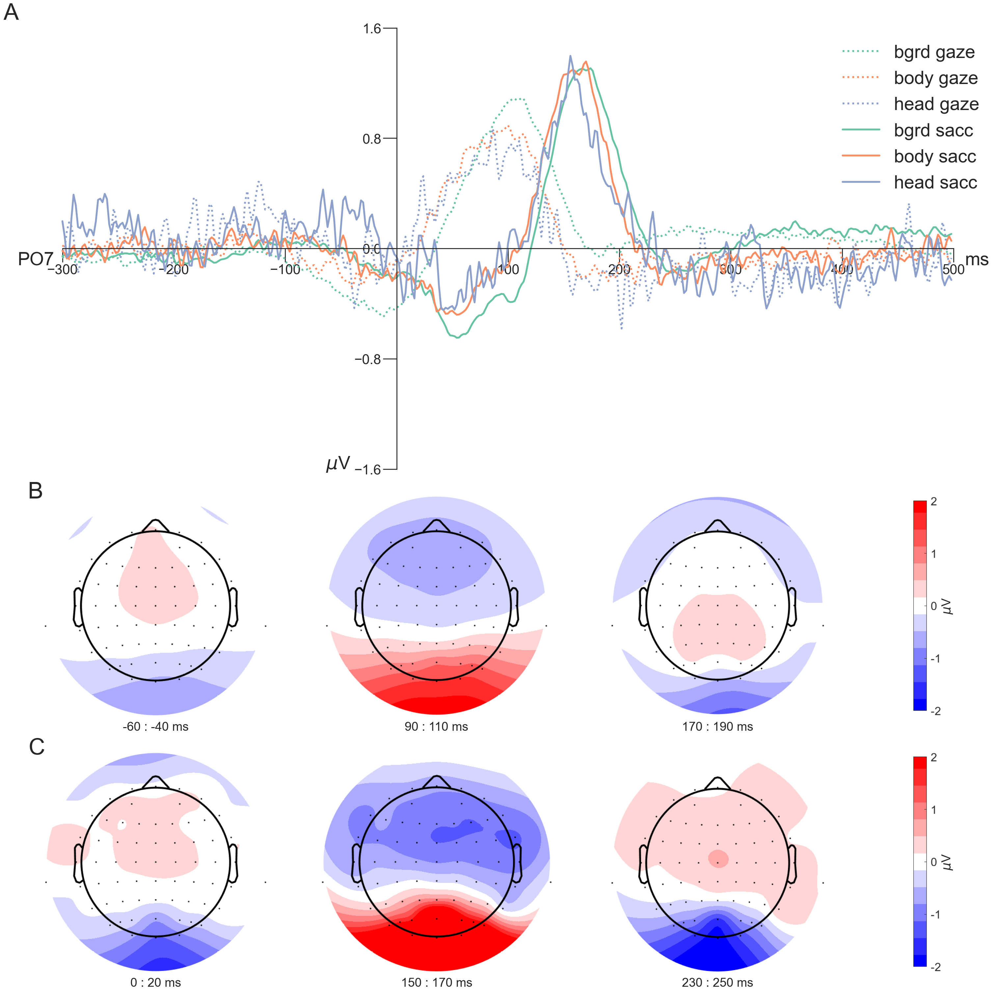

In [17]:
# load the channel file & find the correct row
chan = 'PO7'
chanlocs = scipy.io.loadmat(".../chanLocs.mat")
chanlocs = chanlocs['chanLocs']
chanlocs = np.array([item[0][:] for item in chanlocs['labels'][0]]).tolist()
chanidx = chanlocs.index(chan) # index


mat = scipy.io.loadmat(f"{PATH_EEG}/FacePaper_ERPData_Full.mat") # change this with a file just for that subject
gaze_bgrd = pd.DataFrame(mat['gaze_bgrd'][chanidx,:,:]).transpose()
gaze_body = pd.DataFrame(mat['gaze_body'][chanidx,:,:]).transpose()
gaze_head = pd.DataFrame(mat['gaze_head'][chanidx,:,:]).transpose()
sacc_bgrd = pd.DataFrame(mat['sacc_bgrd'][chanidx,:,:]).transpose()
sacc_body = pd.DataFrame(mat['sacc_body'][chanidx,:,:]).transpose()
sacc_head = pd.DataFrame(mat['sacc_head'][chanidx,:,:]).transpose()

time = mat['times'][0].tolist()

    
rc = {"xtick.direction" : "inout", "ytick.direction" : "inout",
      "xtick.major.size" : 30, "ytick.major.size" : 30,
      "xtick.major.width" : 2, "ytick.major.width" : 2,
     "figure.figsize": (30, 30)}
with plt.rc_context(rc):
    plt.figure(constrained_layout=True)
    sns.set_style("white") 
    # define
    labelsize = 40 # text
    legendsize = 40 # ledgend
    ticksize = 30 # ticks
    numbersize = 60 # A, B etc.
    fname = "Arial" # font name
    plt.rcParams["font.family"] = fname
    # set up grid
    nr_rows = 7
    ax1  = plt.subplot2grid(shape=(4, nr_rows), loc=(0, 0), rowspan=2, colspan=nr_rows)
    ax21 = plt.subplot2grid(shape=(4, nr_rows), loc=(2, 0), rowspan=1, colspan=2)
    ax22 = plt.subplot2grid(shape=(4, nr_rows), loc=(2, 2), rowspan=1, colspan=2)
    ax23 = plt.subplot2grid(shape=(4, nr_rows), loc=(2, 4), rowspan=1, colspan=2)
    ax24 = plt.subplot2grid(shape=(4, nr_rows), loc=(2, 6), rowspan=1, colspan=1)
    
    ax31 = plt.subplot2grid(shape=(4, nr_rows), loc=(3, 0), rowspan=1, colspan=2)
    ax32 = plt.subplot2grid(shape=(4, nr_rows), loc=(3, 2), rowspan=1, colspan=2)
    ax33 = plt.subplot2grid(shape=(4, nr_rows), loc=(3, 4), rowspan=1, colspan=2)
    ax34 = plt.subplot2grid(shape=(4, nr_rows), loc=(3, 6), rowspan=1, colspan=1)

    #### plot the average ERP
    ax1.plot(time,np.nanmean(gaze_bgrd,axis=0).tolist(),color=bgrd_color,linewidth=4,alpha=1,linestyle=':',label="bgrd gaze")
    ax1.plot(time,np.nanmean(gaze_body,axis=0).tolist(),color=body_color,linewidth=4,alpha=1,linestyle=':',label="body gaze")
    ax1.plot(time,np.nanmean(gaze_head,axis=0).tolist(),color=head_color,linewidth=4,alpha=1,linestyle=':',label="head gaze")

    ax1.plot(time,np.nanmean(sacc_bgrd,axis=0).tolist(),color=bgrd_color,linewidth=4,alpha=1,label="bgrd sacc")
    ax1.plot(time,np.nanmean(sacc_body,axis=0).tolist(),color=body_color,linewidth=4,alpha=1,label="body sacc")
    ax1.plot(time,np.nanmean(sacc_head,axis=0).tolist(),color=head_color,linewidth=4,alpha=1,label="head sacc")

    # legend:
    handles, labels = ax1.get_legend_handles_labels()
    legend = ax1.legend(handles,labels,loc="upper right", fontsize=legendsize, frameon=False)
    # axis labels
    ax1.set_ylabel(u'$\it{\u03bc}$' + 'V', fontsize=labelsize, fontname=fname, loc='bottom', rotation = 0)
    ax1.yaxis.set_label_coords(0.315,-0.009)
    ax1.text(-340,-0.12,"PO7", fontsize=labelsize)
    ax1.text(510,-0.12,"ms", fontsize=labelsize)
    # ticks
    x = [-300,-200,-100,100,200,300,400,500]
    ax1.set_xticks(x)
    y = [-1.6,-.8,0,.8,1.6]
    ax1.set_yticks(y)
    for label in ax1.get_xticklabels(): # change tick font
        label.set_fontproperties(fname)
    for label in ax1.get_yticklabels():
        label.set_fontproperties(fname)
    ax1.yaxis.set_tick_params(labelsize=ticksize)  # change tick size
    ax1.xaxis.set_tick_params(labelsize=ticksize)
    # adjust spines
    ax1.spines[['top','right']].set_visible(False)
    ax1.spines[['bottom','left']].set_linewidth(2)
    ax1.spines[['bottom','left']].set_position(('data', 0))
    ax1.spines[['bottom','left']].set_clip_on(True)
    ax1.spines[['left']].set_bounds([- 1.6,1.6])
    ax1.spines[['bottom']].set_bounds([- 300,500])
    ax1.xaxis.set_ticks_position('bottom')
    ax1.yaxis.set_ticks_position('left')

    ax1.set_title("A", fontsize=50, fontweight="bold",loc="left", x=-0.015, y=1.05, pad=-30, fontname=fname) 

    
    ### Difference Plots Gaze 
    ax21.set_title("B", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname) 
    # Around 0: -0.06 till -0.04
    img = plt.imread(f"./images/img_400dpi/Topoplot_gaze_-60_-40400.png")
    ax21.imshow(img)
    ax21.axis('off')
    ax21.text(0.5, -0.05, '-60 : -40 ms',fontsize=27, horizontalalignment='center', verticalalignment='center', transform=ax21.transAxes, fontname=fname)
    # P100: 0.09 till 0.11
    img = plt.imread(f"./images/img_400dpi/Topoplot_gaze_90_110400.png")
    ax22.imshow(img)
    ax22.axis('off')
    ax22.text(0.5, -0.05, '90 : 110 ms',fontsize=27, horizontalalignment='center', verticalalignment='center', transform=ax22.transAxes, fontname=fname)
    # N170: 0.17 till 0.19
    img = plt.imread(f"./images/img_400dpi/Topoplot_gaze_170_190400.png")
    ax23.imshow(img)
    ax23.axis('off')
    ax23.text(0.5, -0.05, '170 : 190 ms',fontsize=27, horizontalalignment='center', verticalalignment='center', transform=ax23.transAxes, fontname=fname)
    # Colorbar:
    img = plt.imread(f"./images/img_400dpi/Colorbar_AvgPlots400.png")
    ax24.imshow(img)
    ax24.axis('off')
    ax24.text(1, 0.5, u'$\it{\u03bc}$' + 'V',fontsize=27,rotation='vertical', horizontalalignment='center', verticalalignment='center', transform=ax24.transAxes, fontname=fname)



    ### Difference Plots Gaze 
    ax31.set_title("C", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname) 
    # Around 0: -0.06 till -0.04
    img = plt.imread(f"./images/img_400dpi/Topoplot_sacc_0_20400.png")
    ax31.imshow(img)
    ax31.axis('off')
    ax31.text(0.5, -0.05, '0 : 20 ms',fontsize=27, horizontalalignment='center', verticalalignment='center', transform=ax31.transAxes, fontname=fname)
    # P100: 0.09 till 0.11
    img = plt.imread(f"./images/img_400dpi/Topoplot_sacc_150_170400.png")
    ax32.imshow(img)
    ax32.axis('off')
    ax32.text(0.5, -0.05, '150 : 170 ms',fontsize=27, horizontalalignment='center', verticalalignment='center', transform=ax32.transAxes, fontname=fname)
    # N170: 0.17 till 0.19
    img = plt.imread(f"./images/img_400dpi/Topoplot_sacc_230_250400.png")
    ax33.imshow(img)
    ax33.axis('off')
    ax33.text(0.5, -0.05, '230 : 250 ms',fontsize=27, horizontalalignment='center', verticalalignment='center', transform=ax33.transAxes, fontname=fname)
    # Colorbar:
    img = plt.imread(f"./images/img_400dpi/Colorbar_AvgPlots400.png")
    ax34.imshow(img)
    ax34.axis('off')
    ax34.text(1, 0.5, u'$\it{\u03bc}$' + 'V',fontsize=27,rotation='vertical', horizontalalignment='center', verticalalignment='center', transform=ax34.transAxes, fontname=fname)

    
    plt.savefig("./Fig4_allSubjects_GazeSacc.png", bbox_inches="tight", pad_inches=0.3, dpi=400)    
    plt.show()

# Figure 5: Unfold & TFCE - distinguish between the three conditions

/net/store/nbp/users/debnolte/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/net/store/nbp/users/debnolte/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/net/store/nbp/users/debnolte/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/net/store/nbp/users/debnolte/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na 

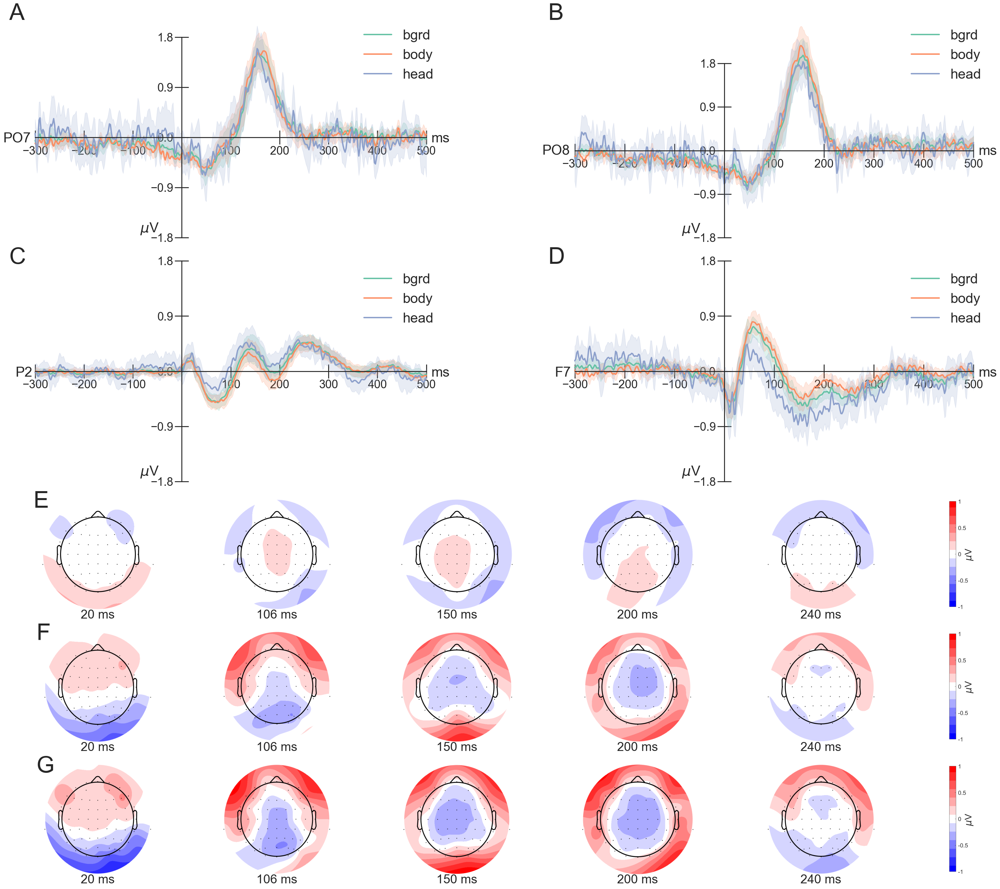

In [21]:
### All Subjects with confidence interval
# Topoplots taken from TFCE_plotResults_forPaper.m
# Data for ERPs taken from collectDataAllVP_finalPlots.m
img_path = './images/img_400dpi'

# get the indicies for the electrodes
channels = ['PO7','PO8','P2','F7']
chanlocs = scipy.io.loadmat(".../chanLocs.mat")
chanlocs = chanlocs['chanLocs']
chanlocs = np.array([item[0][:] for item in chanlocs['labels'][0]]).tolist()
chanidx = [chanlocs.index(channels[0]),chanlocs.index(channels[1]),chanlocs.index(channels[2]),chanlocs.index(channels[3])]

# load the data
mat = scipy.io.loadmat(f"{PATH_EEG}/betasUnfold_saccOnset_allEl_justOverlap.mat") 

# set up figure
rc = {"xtick.direction" : "inout", "ytick.direction" : "inout",
      "xtick.major.size" : 30, "ytick.major.size" : 30,
      "xtick.major.width" : 2, "ytick.major.width" : 2,
     "figure.figsize": (30, 30)}

with plt.rc_context(rc):
    plt.figure(constrained_layout=True)
    # define
    labelsize = 30 # text
    legendsize = 30 # ledgend
    ticksize = 25 # ticks
    numbersize = 60 # A, B etc.
    fname = "Arial" # font name
    plt.rcParams["font.family"] = fname
    # set up grid
    nr_rows = 8
    nr_cols = 11
    # ERPs
    ax11  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 0), rowspan=2, colspan=5)
    ax12  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 6), rowspan=2, colspan=5)
    ax21  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 0), rowspan=2, colspan=5)
    ax22  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 6), rowspan=2, colspan=5)
    axerp = [ax11,ax12,ax21,ax22]
    # Diff bgrd-body
    ax31 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(4, 0), rowspan=1, colspan=2)
    ax32 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(4, 2), rowspan=1, colspan=2)
    ax33 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(4, 4), rowspan=1, colspan=2)
    ax34 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(4, 6), rowspan=1, colspan=2)
    ax35 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(4, 8), rowspan=1, colspan=2)
    ax36 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(4,10), rowspan=1, colspan=1)
    # Diff bgrd-head
    ax41 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(5, 0), rowspan=1, colspan=2)
    ax42 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(5, 2), rowspan=1, colspan=2)
    ax43 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(5, 4), rowspan=1, colspan=2)
    ax44 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(5, 6), rowspan=1, colspan=2)
    ax45 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(5, 8), rowspan=1, colspan=2)
    ax46 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(5,10), rowspan=1, colspan=1)
    # Diff body-head
    ax51 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(6, 0), rowspan=1, colspan=2)
    ax52 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(6, 2), rowspan=1, colspan=2)
    ax53 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(6, 4), rowspan=1, colspan=2)
    ax54 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(6, 6), rowspan=1, colspan=2)
    ax55 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(6, 8), rowspan=1, colspan=2)
    ax56 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(6,10), rowspan=1, colspan=1)
    
    axtopo = [ax31,ax32,ax33,ax34,ax35,ax36,ax41,ax42,ax43,ax44,ax45,ax46,ax51,ax52,ax53,ax54,ax55,ax56]
    

    # ########## for ERPs: for loop to plot both ERP curves ##########
    titlestr = ['A','B','C','D']
    for i in range(len(chanidx)):
        bgrd = pd.DataFrame(mat['bgrd'][:,chanidx[i],:]).transpose()
        body = pd.DataFrame(mat['body'][:,chanidx[i],:]).transpose()
        head = pd.DataFrame(mat['head'][:,chanidx[i],:]).transpose()
        

        ts = mat["time"][0].tolist() # get time
        time = ts[ts.index(list(filter(lambda i: i >= -.3, ts))[0]) : ts.index(list(filter(lambda i: i <= .5, ts))[-1])+ 1]  
        bgrd = bgrd.iloc[ts.index(time[0]) : (ts.index(time[-1]) + 1)].reset_index(drop=True)
        body = body.iloc[ts.index(time[0]) : (ts.index(time[-1]) + 1)]
        head = head.iloc[ts.index(time[0]) : (ts.index(time[-1]) + 1)]
        time = [t * 1000 for t in time]

        # melt the dfs:
        # bgrd
        bgrd['time'] = time
        bgrd = bgrd.set_index(['time']).transpose()
        bgrd['subj'] = bgrd.index.tolist()
        bgrd = pd.melt(bgrd, id_vars='subj', value_vars=time)
        # body
        body['time'] = time
        body = body.set_index(['time']).transpose()
        body['subj'] = body.index.tolist()
        body = pd.melt(body, id_vars='subj', value_vars=time)
        # head
        head['time'] = time
        head = head.set_index(['time']).transpose()
        head['subj'] = head.index.tolist()
        head = pd.melt(head, id_vars='subj', value_vars=time)
        ### plot the data
        sns.lineplot(data=bgrd,x="time",y="value",color=bgrd_color,linewidth=3,ax=axerp[i],label="bgrd")
        sns.lineplot(data=body,x="time",y="value",color=body_color,linewidth=3,ax=axerp[i],label="body")
        sns.lineplot(data=head,x="time",y="value",color=head_color,linewidth=3,ax=axerp[i],label="head")
        # legend:
        handles, labels = axerp[i].get_legend_handles_labels()
        legend = axerp[i].legend(handles,labels,loc="upper right", fontsize=legendsize, frameon=False)
        # axis labels
        axerp[i].set_xlabel('    ')
        axerp[i].set_ylabel('    ')
        axerp[i].yaxis.set_label_coords(0.315,-0.009)
        xpos = [-365,-365,-340,-340]
        axerp[i].text(xpos[i],-0.09,channels[i], fontsize=labelsize)
        axerp[i].text(510,-0.09,"ms", fontsize=labelsize)
        axerp[i].text(-85,-1.7,u'$\it{\u03bc}$' + 'V', fontsize=labelsize)
        # ticks
        x = [-300,-200,-100,100,200,300,400,500]
        axerp[i].set_xticks(x)
        y = [-1.8,-.9,0,.9,1.8]
        axerp[i].set_yticks(y)
        for label in axerp[i].get_xticklabels(): # change tick font
            label.set_fontproperties(fname)
        for label in axerp[i].get_yticklabels():
            label.set_fontproperties(fname)
        axerp[i].yaxis.set_tick_params(labelsize=ticksize)  # change tick size
        axerp[i].xaxis.set_tick_params(labelsize=ticksize)
        # adjust spines
        axerp[i].spines[['top','right']].set_visible(False)
        axerp[i].spines[['bottom','left']].set_linewidth(2)
        axerp[i].spines[['bottom','left']].set_position(('data', 0))
        axerp[i].spines[['bottom','left']].set_clip_on(True)
        axerp[i].spines[['left']].set_bounds([-1.8,1.8])
        axerp[i].spines[['bottom']].set_bounds([- 300,500])
        axerp[i].xaxis.set_ticks_position('bottom')
        axerp[i].yaxis.set_ticks_position('left')
        axerp[i].set_title(titlestr[i], fontsize=50, fontweight="bold",loc="left", x=-0.015, y=1.05, pad=-30, fontname=fname) 

    
    # ########## TopoPlots: for loop to load all Topo Plots ##########
    timepoints = [20,106,150,200,240,0,20,106,150,200,240,0,20,106,150,200,240,0]
    topos = ['Fig5_bgrd_body_20ms_topoDiff400.png','Fig5_bgrd_body_106ms_topoDiff400.png','Fig5_bgrd_body_150ms_topoDiff400.png',
             'Fig5_bgrd_body_200ms_topoDiff400.png','Fig5_bgrd_body_240ms_topoDiff400.png','Fig5_Colorbar_Diffplots_TFCE400.png',
             'Fig5_bgrd_head_20ms_topoDiff400.png','Fig5_bgrd_head_106ms_topoDiff400.png','Fig5_bgrd_head_150ms_topoDiff400.png',
             'Fig5_bgrd_head_200ms_topoDiff400.png','Fig5_bgrd_head_240ms_topoDiff400.png','Fig5_Colorbar_Diffplots_TFCE400.png',
             'Fig5_body_head_20ms_topoDiff400.png','Fig5_body_head_106ms_topoDiff400.png','Fig5_body_head_150ms_topoDiff400.png',
             'Fig5_body_head_200ms_topoDiff400.png','Fig5_body_head_240ms_topoDiff400.png','Fig5_Colorbar_Diffplots_TFCE400.png']
    for i in range(len(topos)):
        img = plt.imread(f"{img_path}/{topos[i]}")
        axtopo[i].imshow(img)
        axtopo[i].axis('off')
        if i not in [5,11,17]:
            axtopo[i].text(0.5, -0.05, f'{timepoints[i]} ms',fontsize=27, horizontalalignment='center', 
                           verticalalignment='center', transform=axtopo[i].transAxes, fontname=fname)
        else:
            axtopo[i].text(1, 0.5, u'$\it{\u03bc}$' + 'V',fontsize=20,rotation='vertical', horizontalalignment='center',
                           verticalalignment='center', transform=axtopo[i].transAxes, fontname=fname)

    
    
    # Topoplot Labels
    ax31.set_title("E", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname)
    ax41.set_title("F", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname) 
    ax51.set_title("G", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname) 
    
    plt.savefig("./Fig5_ERPs_TFCE.png", bbox_inches="tight", pad_inches=0.3, dpi=400)    
    plt.show()


In [27]:
# Average difference across the entire cluster
mat = scipy.io.loadmat(f"{PATH_EEG}/betasUnfold_saccOnset_allEl_justOverlap.mat") # change this with a file just for that subject
# get the time vector
ts = mat['time'][0].tolist()
# select the start and end indices algining with 
start_index = 259
end_index = 374 
time = ts[start_index:end_index]

# Assuming data_3d is your 3D array with shape (participants, dim2, time)
bgrd = mat['bgrd'][:, :, start_index:end_index]
body = mat['body'][:, :, start_index:end_index]
head = mat['head'][:, :, start_index:end_index]
vps, el_len, time_len = bgrd.shape

# reshape it into 2D arrat and create df (participants, electrodes * time)
bgrd = pd.DataFrame(bgrd.reshape(vps, el_len * time_len))
body = pd.DataFrame(body.reshape(vps, el_len * time_len))
head = pd.DataFrame(head.reshape(vps, el_len * time_len))

# get the difference between two conditions
bgrd_body = bgrd - body
bgrd_head = bgrd - head
body_head = body - head

# get the average results
print(f"bgrd-body: mean difference = {round(np.mean(bgrd_body.median(axis=1)),3)}")
print(f"bgrd-head: mean difference = {round(np.mean(bgrd_head.median(axis=1)),3)}")
print(f"body-head: mean difference = {round(np.mean(body_head.median(axis=1)),3)}")


bgrd-body: mean difference = 0.001
bgrd-head: mean difference = -0.008
body-head: mean difference = -0.005


In [40]:
### Checking differences at the center of significant cluster
tfce_path = '.../TFCE_Plots'
# get the indicies for the electrodes
channels = 'F7'
chanlocs = scipy.io.loadmat(".../chanLocs.mat")
chanlocs = chanlocs['chanLocs']
chanlocs = np.array([item[0][:] for item in chanlocs['labels'][0]]).tolist()
chanidx = chanlocs.index(channels)

mat = scipy.io.loadmat(f"{PATH_EEG}/betasUnfold_saccOnset_allEl_justOverlap.mat") # change this with a file just for that subject
times = mat['time'][0].tolist()
timeidx = times.index(.106)


bgrd = mat['bgrd'][:,chanidx,timeidx].tolist()
body = mat['body'][:,chanidx,timeidx].tolist()
head = mat['head'][:,chanidx,timeidx].tolist()

bgrd_body = [x - y for x, y in zip(bgrd, body)] 
bgrd_head = [x - y for x, y in zip(bgrd, head)]
body_head = [x - y for x, y in zip(body, head)]

print(f"bgrd-body: median difference at cluster center = {round(np.median(bgrd_body),3)}")
print(f"bgrd-head: median difference at cluster center = {round(np.median(bgrd_head),3)}")
print(f"body-head: median difference at cluster center = {round(np.median(body_head),3)}")

bgrd-body: median difference at cluster center = -0.174
bgrd-head: median difference at cluster center = 0.505
body-head: median difference at cluster center = 0.658


# Figure 6: TFCE - Plot effect size

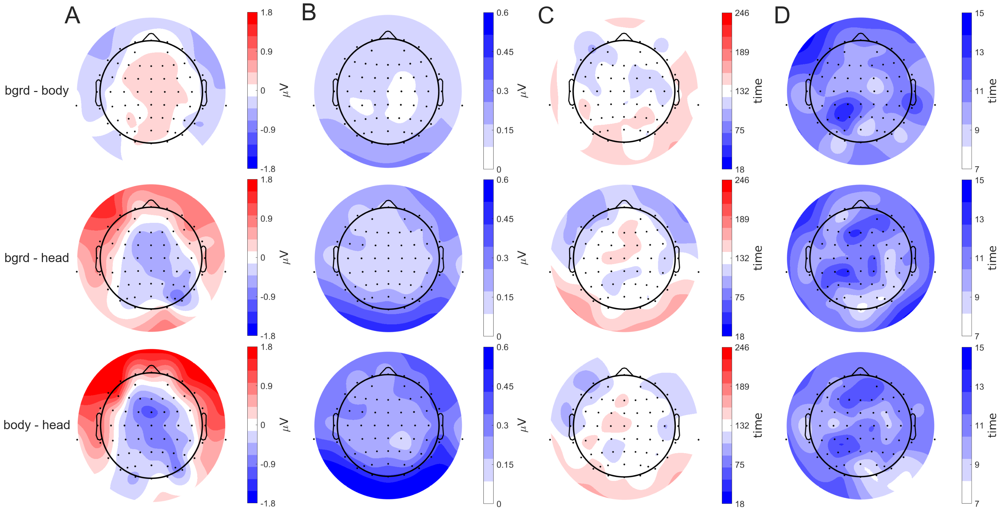

In [23]:
### All Subjects with confidence interval
# Topoplots taken from TFCE_plotResults_forPaper.m
# Data for ERPs taken from collectDataAllVP_finalPlots.m
img_path = './images/img_400dpi'

plt.figure(figsize=(30, 15), constrained_layout=True)
sns.set_style("white") 

# define
labelsize = 30 # text
legendsize = 30 # ledgend
ticksize = 25 # ticks
numbersize = 60 # A, B etc.
fname = "Arial" # font name
plt.rcParams["font.family"] = fname
# set up grid
nr_rows = 3
nr_cols = 12
# bgrd - body
ax1  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 0), rowspan=1, colspan=2)
ax2  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 2), rowspan=1, colspan=1)
ax3  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 3), rowspan=1, colspan=2)
ax4  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 5), rowspan=1, colspan=1)
ax5  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 6), rowspan=1, colspan=2)
ax6  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 8), rowspan=1, colspan=1)
ax7  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0, 9), rowspan=1, colspan=2)
ax8  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(0,11), rowspan=1, colspan=1)
# bgrd - head
ax9  = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(1, 0), rowspan=1, colspan=2)
ax10 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(1, 2), rowspan=1, colspan=1)
ax11 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(1, 3), rowspan=1, colspan=2)
ax12 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(1, 5), rowspan=1, colspan=1)
ax13 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(1, 6), rowspan=1, colspan=2)
ax14 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(1, 8), rowspan=1, colspan=1)
ax15 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(1, 9), rowspan=1, colspan=2)
ax16 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(1,11), rowspan=1, colspan=1)
# body - head
ax17 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 0), rowspan=1, colspan=2)
ax18 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 2), rowspan=1, colspan=1)
ax19 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 3), rowspan=1, colspan=2)
ax20 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 5), rowspan=1, colspan=1)
ax21 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 6), rowspan=1, colspan=2)
ax22 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 8), rowspan=1, colspan=1)
ax23 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2, 9), rowspan=1, colspan=2)
ax24 = plt.subplot2grid(shape=(nr_rows, nr_cols), loc=(2,11), rowspan=1, colspan=1)


axtopo = [ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10,ax11,ax12,ax13,ax14,ax15,ax16,
          ax17,ax18,ax19,ax20,ax21,ax22,ax23,ax24]


# ########## TopoPlots: for loop to load all Topo Plots ##########
cond = ['bgrd - body', 'bgrd - head', 'body - head']
c = 0
topos = ['Fig6_bgrd_body_avgVals400.png','Fig6_Colorbar_avgVals400.png',
         'Fig6_bgrd_body_stderrorVals400.png','Fig6_Colorbar_stderrorVals400.png',
         'Fig6_bgrd_body_avgTime400.png','Fig6_Colorbar_avgTime400.png',
         'Fig6_bgrd_body_stderrorTime400.png','Fig6_Colorbar_stderrorTime400.png',
         
         'Fig6_bgrd_head_avgVals400.png','Fig6_Colorbar_avgVals400.png',
         'Fig6_bgrd_head_stderrorVals400.png','Fig6_Colorbar_stderrorVals400.png',
         'Fig6_bgrd_head_avgTime400.png','Fig6_Colorbar_avgTime400.png',
         'Fig6_bgrd_head_stderrorTime400.png','Fig6_Colorbar_stderrorTime400.png',
         
         'Fig6_body_head_avgVals400.png','Fig6_Colorbar_avgVals400.png',
         'Fig6_body_head_stderrorVals400.png','Fig6_Colorbar_stderrorVals400.png',
         'Fig6_body_head_avgTime400.png','Fig6_Colorbar_avgTime400.png',
         'Fig6_body_head_stderrorTime400.png','Fig6_Colorbar_stderrorTime400.png']
for i in range(len(topos)):
    img = plt.imread(f"{img_path}/{topos[i]}")
    axtopo[i].imshow(img)
    axtopo[i].axis('off')
    
    if i in [0,8,16]:
        axtopo[i].text(-0.25, 0.5, f'{cond[c]}',fontsize=27, horizontalalignment='center', 
                       verticalalignment='center', transform=axtopo[i].transAxes, fontname=fname)
        c = c+1


# Topoplot Labels
ax1.set_title("A", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname)
ax3.set_title("B", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname) 
ax5.set_title("C", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname) 
ax7.set_title("D", fontsize=50, fontweight="bold",loc="left", x=-0.07, y=1.05, pad=-30, fontname=fname)

plt.savefig("./Fig6_TFCE_maxContribution.png", bbox_inches="tight", pad_inches=0.3, dpi=400)  

plt.show()
